In [166]:
import os, glob
import mmcv
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

GIFs:
- true flow / orig flow / causal flow
- results flow inpaint only: true video / true with mask*** / orig / causal
- results flow + image inpainted: true video / true video with mask*** / orig model / causal model / inpaint only
- original model and my model: true flow / coarse flow / stage2 flow / stage3 flow

Tables:
- PSNR and SSIM scores: orig / causal / no-flow (deep inpaint only)

In [8]:
demo_dirs = {
"flamingo" : "../demo_results/flamingo",
"ladyrunning" : "../demo_results/lady-running",
"spiderman" : "../demo_results/spider-man"
}
true_flow_dir = "Flow"
frames_dir = "frames"
causal_dir = "my_model"
save_dir = "visualizations"

In [132]:
def get_masked_frame(frame_path, target_shape):
    scene_dir = os.path.split(os.path.split(frame_path)[-2])[-2]
    frame_name = os.path.split(frame_path)[-1].split(".")[-2]
    if "lady-running" in scene_dir:
        mask = cv2.imread(os.path.join(scene_dir, "mask_bbox.png"), cv2.IMREAD_GRAYSCALE) > 0.
    else:
        mask = cv2.imread(os.path.join(scene_dir, "masks", frame_name+".png"), cv2.IMREAD_GRAYSCALE) > 0.
    frame_masked = cv2.resize(cv2.cvtColor(cv2.imread(frame_path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB),
                              (mask.shape[1], mask.shape[0]))
    red = np.zeros(frame_masked.shape); red[...,0] = 255;
    frame_masked[mask, 0] = (frame_masked[mask, 0]+red[mask, 0])/2.
    return cv2.resize(frame_masked, (target_shape[1], target_shape[0]))

# GIFs: True flow / orig flow / causal flow

In [359]:
for scene_name in demo_dirs.keys():
    flow_path = os.path.join(demo_dirs[scene_name], true_flow_dir)
    flow_imgs = []
    for true_flow_filepath in sorted(glob.glob(os.path.join(flow_path,"*.flo"))):
        true_flow_filename = os.path.split(true_flow_filepath)[-1]
        orig_flow_filepath = os.path.join(demo_dirs[scene_name], "original_results", "Flow_res", "stage3_res", true_flow_filename)
        causal_flow_filepath = os.path.join(demo_dirs[scene_name], "my_model", "Flow_res", "stage3_res", true_flow_filename)
        true_flow = mmcv.flowread(true_flow_filepath)
        true_flow_img = cv2.resize(mmcv.visualization.flow2rgb(true_flow), (840,480))
        orig_flow = mmcv.flowread(orig_flow_filepath)
        orig_flow_img = mmcv.visualization.flow2rgb(orig_flow)
        causal_flow = mmcv.flowread(causal_flow_filepath)
        causal_flow_img = mmcv.visualization.flow2rgb(causal_flow)
        cat_img = np.concatenate((true_flow_img, orig_flow_img, causal_flow_img), axis=1)
        cat_img = cv2.resize(cat_img, (cat_img.shape[1]//2, cat_img.shape[0]//2))
        cat_img = np.uint8(255*cat_img)
        cat_img = Image.fromarray(cat_img)
        flow_imgs.append(cat_img)
    gif_filename = os.path.join(save_dir,"true_orig_causal_flows_"+scene_name+".gif")
    print(gif_filename)
    flow_imgs[0].save(gif_filename, save_all=True, append_images=flow_imgs[1:], optimize=False, duration=40, loop=0)

visualizations/true_orig_causal_flows_flamingo.gif
visualizations/true_orig_causal_flows_ladyrunning.gif
visualizations/true_orig_causal_flows_spiderman.gif


# GIFs: results flow inpaint only: true / orig / causal

In [360]:
for scene in demo_dirs.keys():
    gif_imgs = []
    true_dir = os.path.join(demo_dirs[scene], "frames")
    my_model_dir = os.path.join(demo_dirs[scene], "my_model", "Inpaint_Res_no_infill", "inpaint_res")
    orig_model_dir = os.path.join(demo_dirs[scene], "original_results", "Inpaint_Res_no_infill", "inpaint_res")
    my_model_paths = sorted(glob.glob(os.path.join(my_model_dir, "*")))
    orig_model_paths = sorted(glob.glob(os.path.join(orig_model_dir, "*")))
    assert(len(my_model_paths) == len(orig_model_paths))
    true_paths = sorted(glob.glob(os.path.join(true_dir, "*")))[:len(my_model_paths)]
    for true_path, my_model_path, orig_model_path in zip(true_paths, my_model_paths, orig_model_paths):
        true = cv2.cvtColor(cv2.imread(true_path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
        orig_model = cv2.cvtColor(cv2.imread(orig_model_path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
        my_model = cv2.cvtColor(cv2.imread(my_model_path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
        true = cv2.resize(true, (my_model.shape[1], my_model.shape[0]))
        true_masked = get_masked_frame(true_path, my_model.shape)
        cat_top = np.concatenate((true,true_masked), axis=1)
        cat_bottom = np.concatenate((orig_model,my_model), axis=1)
        cat_img = np.concatenate((cat_top, cat_bottom), axis=0)
        cat_img = cv2.resize(cat_img, (cat_img.shape[1]//2, cat_img.shape[0]//2))
        cat_img = Image.fromarray(cat_img)
        gif_imgs.append(cat_img)
    gif_filename = os.path.join(save_dir, "flow_inpaint_only_"+scene+".gif")
    print(gif_filename)
    gif_imgs[0].save(gif_filename, save_all=True, append_images=gif_imgs[1:], optimize=False, duration=40, loop=0)

visualizations/flow_inpaint_only_flamingo.gif
visualizations/flow_inpaint_only_ladyrunning.gif
visualizations/flow_inpaint_only_spiderman.gif


# GIFs: results flow + image inpainted: true / orig / causal

In [361]:
for scene in demo_dirs.keys():
    gif_imgs = []
    true_dir = os.path.join(demo_dirs[scene], "frames")
    inpaint_dir = os.path.join(demo_dirs[scene], "frames_inpainted")
    my_model_dir = os.path.join(demo_dirs[scene], "my_model", "Inpaint_Res_with_infill", "inpaint_res")
    orig_model_dir = os.path.join(demo_dirs[scene], "original_results", "Inpaint_Res_with_infill", "inpaint_res")
    inpaint_paths = sorted(glob.glob(os.path.join(inpaint_dir, "*")))
    my_model_paths = sorted(glob.glob(os.path.join(my_model_dir, "*")))
    orig_model_paths = sorted(glob.glob(os.path.join(orig_model_dir, "*")))
    assert(len(my_model_paths) == len(orig_model_paths))
    true_paths = sorted(glob.glob(os.path.join(true_dir, "*")))[:len(my_model_paths)]
    for true_path, inpaint_path, my_model_path, orig_model_path in zip(true_paths, inpaint_paths, my_model_paths, orig_model_paths):
        true = cv2.cvtColor(cv2.imread(true_path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
        inpaint = cv2.cvtColor(cv2.imread(inpaint_path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
        orig_model = cv2.cvtColor(cv2.imread(orig_model_path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
        my_model = cv2.cvtColor(cv2.imread(my_model_path, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
        true = cv2.resize(true, (my_model.shape[1], my_model.shape[0]))
        true_masked = get_masked_frame(true_path, my_model.shape)
        cat_top = np.concatenate((true,inpaint), axis=1)
        cat_bottom = np.concatenate((orig_model,my_model), axis=1)
        cat_img = np.concatenate((cat_top, cat_bottom), axis=0)
        cat_img = cv2.resize(cat_img, (cat_img.shape[1]//2, cat_img.shape[0]//2))
        cat_img = Image.fromarray(cat_img)
        gif_imgs.append(cat_img)
    gif_filename = os.path.join(save_dir, "full_video_inpainting_"+scene+".gif")
    print(gif_filename)
    gif_imgs[0].save(gif_filename, save_all=True, append_images=gif_imgs[1:], optimize=False, duration=40, loop=0)

visualizations/full_video_inpainting_flamingo.gif
visualizations/full_video_inpainting_ladyrunning.gif
visualizations/full_video_inpainting_spiderman.gif


# GIFs: causal and original model: coarse flow / stage2 flow / stage3 flow

In [362]:
for scene in demo_dirs.keys():
    scene_dir = demo_dirs[scene]
    model_img_arrs = []
    for model_folder in ["my_model", "original_results"]:
        stage_img_arrs = []
        for stage_folder in ["initial_res","stage2_res","stage3_res"]:
            flow_dir = os.path.join(scene_dir, model_folder, "Flow_res", stage_folder)
            img_arr = [ mmcv.visualization.flow2rgb(mmcv.flowread(flow_path)) \
                        for flow_path in sorted(glob.glob(os.path.join(flow_dir, "*.flo"))) ]
            stage_img_arrs.append(img_arr)
        mdl_img_arr = [np.concatenate( [cv2.resize(stage_img_arrs[j][i], (840,480)) for j in range(3)], axis=1) 
                                                               for i in range(len(stage_img_arrs[0]))]
        model_img_arrs.append(mdl_img_arr)
    scene_gif_imgs = [np.concatenate([model_img_arrs[j][i] for j in range(2)], axis=0) 
                                                                      for i in range(len(model_img_arrs[0]))]
    scene_gif_imgs = [cv2.resize(cat_img, (cat_img.shape[1]//2, cat_img.shape[0]//2)) for cat_img in scene_gif_imgs]
    gif_filename = os.path.join(save_dir, "flow_stages_"+scene+".gif")
    print(gif_filename)
    scene_gif_imgs = [Image.fromarray(np.uint8(255*img)) for img in scene_gif_imgs] # to PIL
    scene_gif_imgs[0].save(gif_filename, save_all=True, append_images=scene_gif_imgs[1:], optimize=False, duration=40, loop=0)

visualizations/flow_stages_flamingo.gif
visualizations/flow_stages_ladyrunning.gif
visualizations/flow_stages_spiderman.gif


# PSNR and SSIM scores: orig model / causal model / no-flow (deep inpaint only)

In [189]:
frame_dirs = ["original_results/Inpaint_Res_with_infill/inpaint_res",
              "my_model/Inpaint_Res_with_infill/inpaint_res",
              "frames_inpainted"]
psnr_scores = {fd:[] for fd in frame_dirs}
ssim_scores = {fd:[] for fd in frame_dirs}

for scene in demo_dirs.keys():
    cnt = 0
    for frame_path in sorted(glob.glob(os.path.join(demo_dirs[scene], "frames", "*")))[:-1]:
        frame_name_minus_ext = os.path.split(frame_path)[-1][:-4]
        frame1 = cv2.imread(frame_path, cv2.IMREAD_COLOR)
        for frame_dir in frame_dirs:
            glb = glob.glob(os.path.join(demo_dirs[scene], frame_dir, frame_name_minus_ext+"*"))
            assert(len(glb)==1)
            frame_path2 = glb[0]
            frame2 = cv2.imread(frame_path2, cv2.IMREAD_COLOR)
            frame2 = cv2.resize(frame2, (frame1.shape[1], frame1.shape[0]))
            # PSNR
            p = psnr(frame1, frame2)
            psnr_scores[frame_dir].append( p )
            # SSIM 
            s = ssim(frame1, frame2, multichannel=True)
            ssim_scores[frame_dir].append( s )    
        cnt += 1
    print(scene," has %d scores" % cnt)

flamingo  has 79 scores
ladyrunning  has 59 scores
spiderman  has 46 scores


In [194]:
print("--- PSNR -------------------")
for fd in psnr_scores.keys():
    print(fd)
    print("\t",np.mean(psnr_scores[fd]))
print("--- SSIM -------------------")
for fd in ssim_scores.keys():
    print(fd)
    print("\t", np.mean(ssim_scores[fd]))

--- PSNR -------------------
original_results/Inpaint_Res_with_infill/inpaint_res
	 23.416622899102116
my_model/Inpaint_Res_with_infill/inpaint_res
	 22.543206307153454
frames_inpainted
	 23.0825606980921
--- SSIM -------------------
original_results/Inpaint_Res_with_infill/inpaint_res
	 0.9360328459555648
my_model/Inpaint_Res_with_infill/inpaint_res
	 0.9275455049942272
frames_inpainted
	 0.9238074299312176


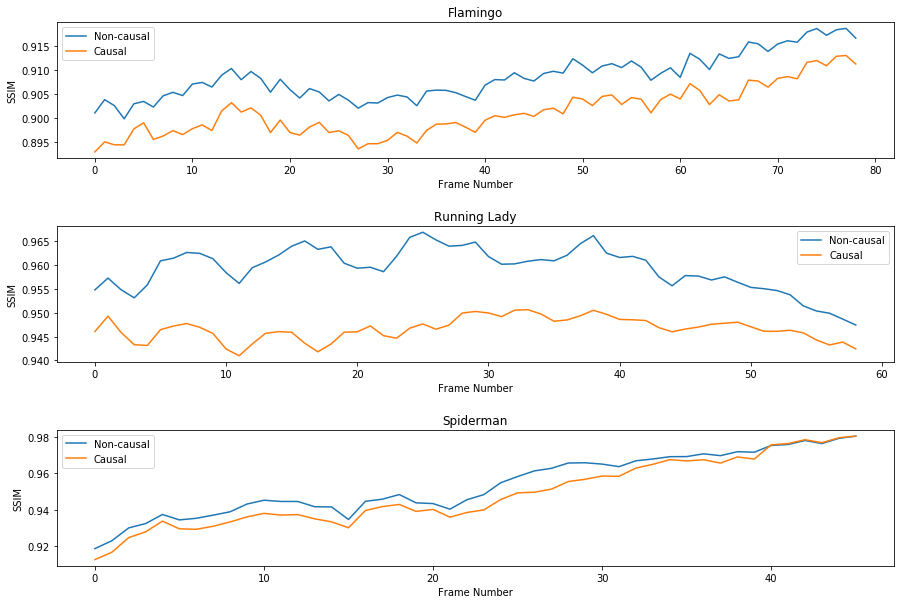

In [339]:
flamingo_orig_model_ssim  = ssim_scores["original_results/Inpaint_Res_with_infill/inpaint_res"][:79]
lady_orig_model_ssim      = ssim_scores["original_results/Inpaint_Res_with_infill/inpaint_res"][79:79+59]
spiderman_orig_model_ssim = ssim_scores["original_results/Inpaint_Res_with_infill/inpaint_res"][79+59:]

flamingo_my_model_ssim  = ssim_scores["my_model/Inpaint_Res_with_infill/inpaint_res"][:79]
lady_my_model_ssim      = ssim_scores["my_model/Inpaint_Res_with_infill/inpaint_res"][79:79+59]
spiderman_my_model_ssim = ssim_scores["my_model/Inpaint_Res_with_infill/inpaint_res"][79+59:]


plt.figure(figsize=(15,10))
plt.subplot(3, 1, 1)
plt.title("Flamingo")
plt.plot(flamingo_orig_model_ssim)
plt.plot(flamingo_my_model_ssim)
plt.ylabel("SSIM")
plt.xlabel("Frame Number")
plt.legend(["Non-causal", "Causal"])
plt.subplots_adjust(hspace=.5)
plt.subplot(3, 1, 2)
plt.title("Running Lady")
plt.plot(lady_orig_model_ssim)
plt.plot(lady_my_model_ssim)
plt.ylabel("SSIM")
plt.xlabel("Frame Number")
plt.legend(["Non-causal", "Causal"])
plt.subplot(3, 1, 3)
plt.title("Spiderman")
plt.plot(spiderman_orig_model_ssim)
plt.plot(spiderman_my_model_ssim)
plt.ylabel("SSIM")
plt.xlabel("Frame Number")
plt.legend(["Non-causal", "Causal"])
plt.show()

# Full inpainting

In [276]:
demo_framenames = {
"flamingo" : ["00000.jpg","00026.jpg","00052.jpg","00078.jpg"],
"ladyrunning" : ["00005.jpg","00020.jpg","00040.jpg","00063.jpg"],
"spiderman" : ["00190.png","00205.png","00221.png","00235.png"]
}

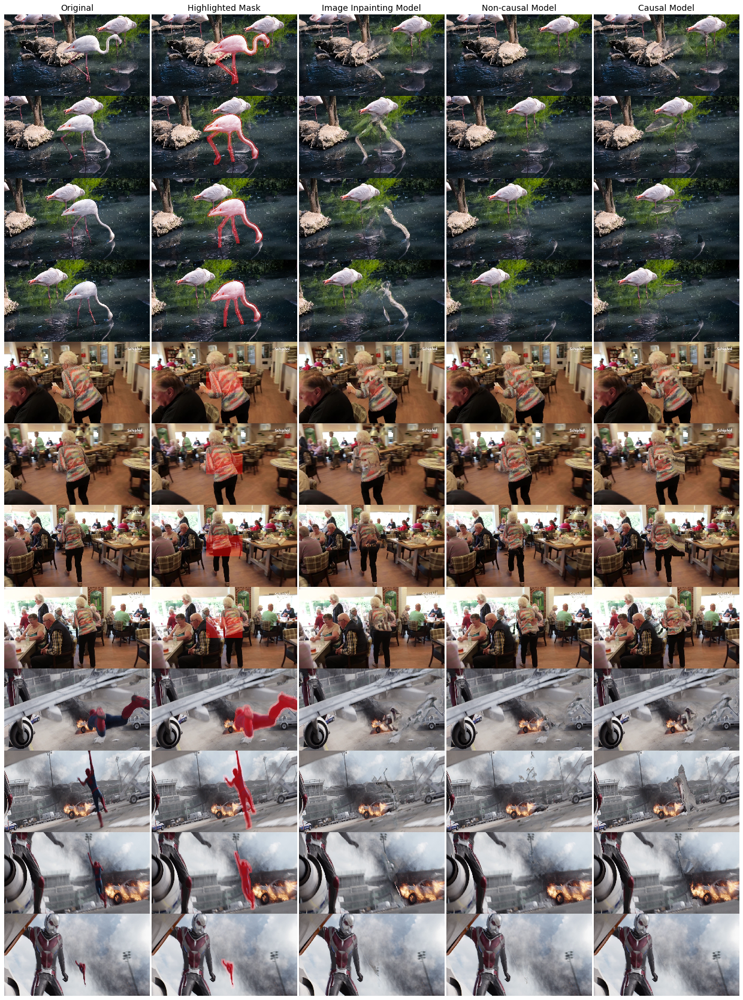

In [295]:
import matplotlib.gridspec as gridspec

plt_size = 40.
nrows = 12; ncols = 5
plt_aspect = cv2.imread(os.path.join(demo_dirs["flamingo"],"frames","00000.jpg"), cv2.IMREAD_COLOR).shape
plt_aspect = (plt_aspect[0]*nrows, plt_aspect[1]*ncols)
summ = plt_aspect[0] + plt_aspect[1]
plt_aspect = (plt_aspect[0]/summ, plt_aspect[1]/summ)
figsz = (plt_aspect[1]*plt_size,plt_aspect[0]*plt_size)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsz)
col = 0
col_titles = ["Original", "Highlighted Mask", "Image Inpainting Model", "Non-causal Model", "Causal Model"]
for img_type in ["orig","redmask","imginp", "noncausal", "causal"]:
    row = 0
    for scene in demo_dirs.keys():
        for img_num in range(len(demo_framenames[scene])):
            img = None
            if img_type is "orig" or img_type is "redmask":
                pth = os.path.join(demo_dirs[scene],"frames",demo_framenames[scene][img_num])
                img = cv2.cvtColor(cv2.imread(pth, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
                if img_type is "redmask":
                    img = get_masked_frame(pth, img.shape)
            if img_type is "imginp":
                pth = os.path.join(demo_dirs[scene],"frames_inpainted",demo_framenames[scene][img_num])
                img = cv2.cvtColor(cv2.imread(pth, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
            if img_type is "noncausal":
                img_filename = demo_framenames[scene][img_num].split(".")[-2] + ".png"
                pth = os.path.join(demo_dirs[scene],"original_results","Inpaint_Res_with_infill","inpaint_res", \
                                   img_filename)
                img = cv2.cvtColor(cv2.imread(pth, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
            if img_type is "causal":
                img_filename = demo_framenames[scene][img_num].split(".")[-2] + ".png"
                pth = os.path.join(demo_dirs[scene],"my_model","Inpaint_Res_with_infill","inpaint_res", \
                                   img_filename)
                img = cv2.cvtColor(cv2.imread(pth, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
            axes[row,col].axis('off')
            if row==0:
                axes[row,col].set_title(col_titles[col], fontsize=14)
            axes[row,col].imshow(img, aspect='auto')
            plt.subplots_adjust(hspace = row*.05)
            row += 1
    col += 1
plt.tight_layout(pad=0., w_pad=.25)
plt.show()

# Backprop removed frames

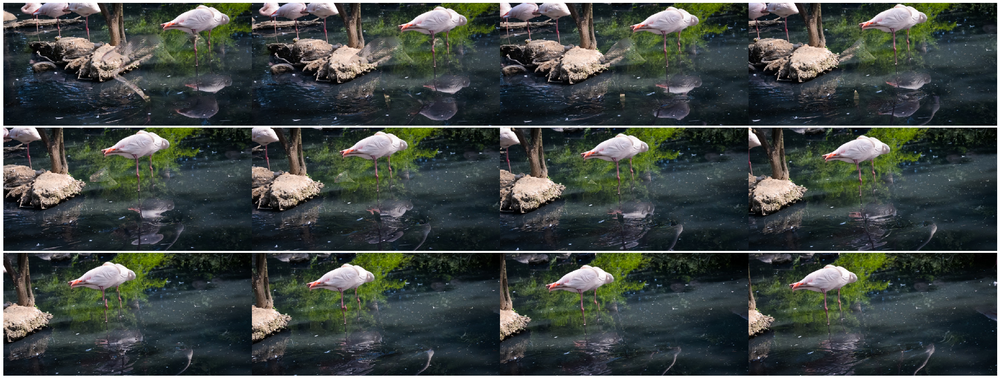

In [307]:
# plt_size = 40.
# nrows = 3; ncols = 4
# plt_aspect = cv2.imread(os.path.join(demo_dirs["flamingo"],"no_backward_prop","Inpaint_Res","inpaint_res", \
#                                      "00000.png"), cv2.IMREAD_COLOR).shape
# plt_aspect = (plt_aspect[0]*nrows, plt_aspect[1]*ncols)
# summ = plt_aspect[0] + plt_aspect[1]
# plt_aspect = (plt_aspect[0]/summ, plt_aspect[1]/summ)
# figsz = (plt_aspect[1]*plt_size,plt_aspect[0]*plt_size)
# fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsz)

# i = 0
# for frame_name in ["%05d.png" % num for num in range(0,78,7)]:
#     img = cv2.cvtColor(cv2.imread(os.path.join(demo_dirs["flamingo"],"no_backward_prop","Inpaint_Res", \
#                                                "inpaint_res", frame_name), cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
#     axes.flat[i].axis('off')
#     axes.flat[i].imshow(img, aspect='auto')
#     i += 1

# plt.tight_layout(pad=0., h_pad=.4)
# plt.show()



plt_size = 40.
nrows = 4; ncols = 4
plt_aspect = cv2.imread(os.path.join(demo_dirs["flamingo"],"frames","00000.jpg"), cv2.IMREAD_COLOR).shape
plt_aspect = (plt_aspect[0]*nrows, plt_aspect[1]*ncols)
summ = plt_aspect[0] + plt_aspect[1]
plt_aspect = (plt_aspect[0]/summ, plt_aspect[1]/summ)
figsz = (plt_aspect[1]*plt_size,plt_aspect[0]*plt_size)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsz)
col = 0
col_titles = ["Original", "Highlighted Mask", "Non-causal Model", "Causal Model"]
for img_type in ["orig","redmask", "noncausal", "causal"]:
    row = 0
    for scene in ["flamingo"]:
        for img_num in range(len(demo_framenames[scene])):
            img = None
            if img_type is "orig" or img_type is "redmask":
                pth = os.path.join(demo_dirs[scene],"frames",demo_framenames[scene][img_num])
                img = cv2.cvtColor(cv2.imread(pth, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
                if img_type is "redmask":
                    img = get_masked_frame(pth, img.shape)
            if img_type is "noncausal":
                img_filename = demo_framenames[scene][img_num].split(".")[-2] + ".png"
                pth = os.path.join(demo_dirs[scene],"original_results","Inpaint_Res_no_infill","inpaint_res", \
                                   img_filename)
                img = cv2.cvtColor(cv2.imread(pth, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
            if img_type is "causal":
                img_filename = demo_framenames[scene][img_num].split(".")[-2] + ".png"
                pth = os.path.join(demo_dirs[scene],"my_model","Inpaint_Res_no_infill","inpaint_res", \
                                   img_filename)
                img = cv2.cvtColor(cv2.imread(pth, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
            axes[row,col].axis('off')
            if row==0:
                axes[row,col].set_title(col_titles[col], fontsize=14)
            axes[row,col].imshow(img, aspect='auto')
            plt.subplots_adjust(hspace = row*.05)
            row += 1
    col += 1
plt.tight_layout(pad=0., w_pad=.25)
plt.show()

# Flow inpaint only, flamingo

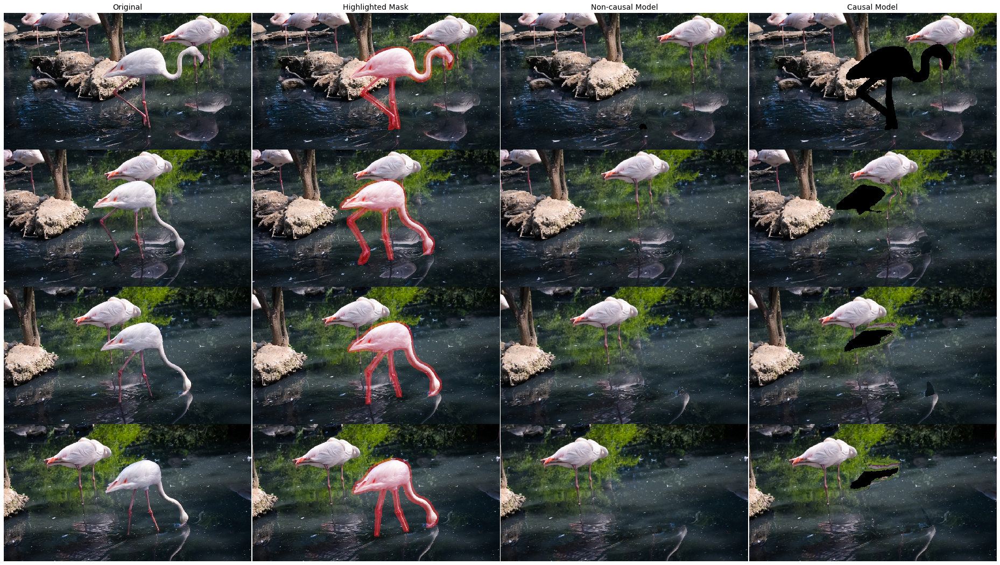

In [311]:
plt_size = 40.
nrows = 4; ncols = 4
plt_aspect = cv2.imread(os.path.join(demo_dirs["flamingo"],"frames","00000.jpg"), cv2.IMREAD_COLOR).shape
plt_aspect = (plt_aspect[0]*nrows, plt_aspect[1]*ncols)
summ = plt_aspect[0] + plt_aspect[1]
plt_aspect = (plt_aspect[0]/summ, plt_aspect[1]/summ)
figsz = (plt_aspect[1]*plt_size,plt_aspect[0]*plt_size)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsz)
col = 0
col_titles = ["Original", "Highlighted Mask", "Non-causal Model", "Causal Model"]
for img_type in ["orig","redmask", "noncausal", "causal"]:
    row = 0
    for scene in ["flamingo"]:
        for img_num in range(len(demo_framenames[scene])):
            img = None
            if img_type is "orig" or img_type is "redmask":
                pth = os.path.join(demo_dirs[scene],"frames",demo_framenames[scene][img_num])
                img = cv2.cvtColor(cv2.imread(pth, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
                if img_type is "redmask":
                    img = get_masked_frame(pth, img.shape)
            if img_type is "noncausal":
                img_filename = demo_framenames[scene][img_num].split(".")[-2] + ".png"
                pth = os.path.join(demo_dirs[scene],"original_results","Inpaint_Res_no_infill","inpaint_res", \
                                   img_filename)
                img = cv2.cvtColor(cv2.imread(pth, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
            if img_type is "causal":
                img_filename = demo_framenames[scene][img_num].split(".")[-2] + ".png"
                pth = os.path.join(demo_dirs[scene],"my_model","Inpaint_Res_no_infill","inpaint_res", \
                                   img_filename)
                img = cv2.cvtColor(cv2.imread(pth, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
            axes[row,col].axis('off')
            if row==0:
                axes[row,col].set_title(col_titles[col], fontsize=14)
            axes[row,col].imshow(img, aspect='auto')
            plt.subplots_adjust(hspace = row*.05)
            row += 1
    col += 1
plt.tight_layout(pad=0., w_pad=.25)
plt.show()

# Flow compare

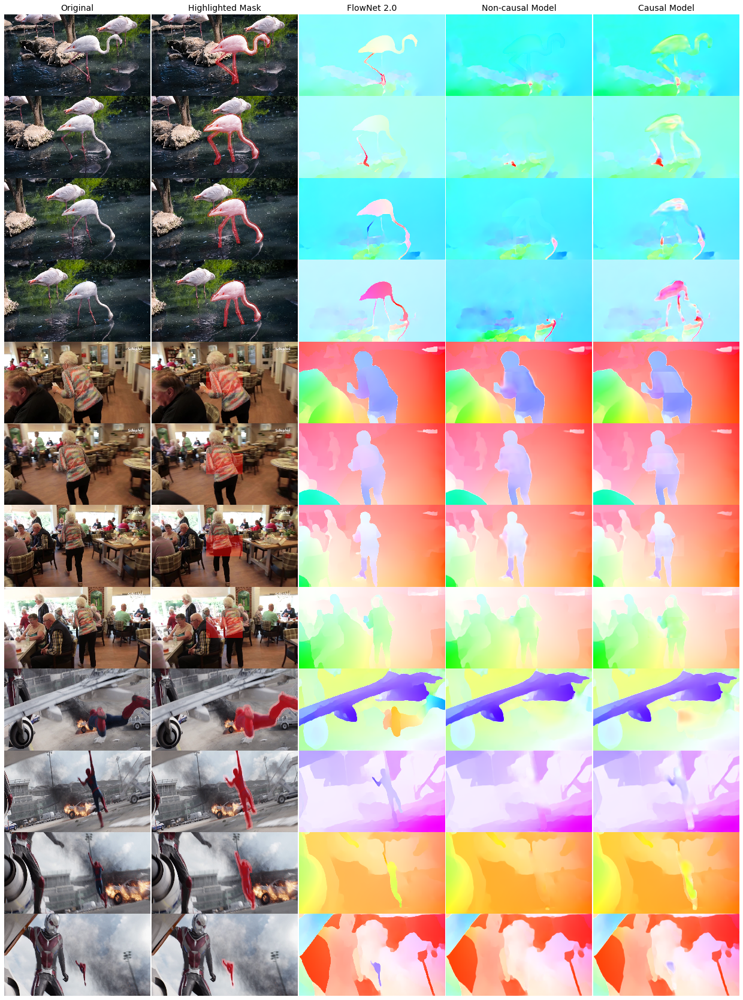

In [318]:
plt_size = 40.
nrows = 12; ncols = 5
plt_aspect = cv2.imread(os.path.join(demo_dirs["flamingo"],"frames","00000.jpg"), cv2.IMREAD_COLOR).shape
plt_aspect = (plt_aspect[0]*nrows, plt_aspect[1]*ncols)
summ = plt_aspect[0] + plt_aspect[1]
plt_aspect = (plt_aspect[0]/summ, plt_aspect[1]/summ)
figsz = (plt_aspect[1]*plt_size,plt_aspect[0]*plt_size)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsz)
col = 0
col_titles = ["Original", "Highlighted Mask", "FlowNet 2.0", "Non-causal Model", "Causal Model"]
for img_type in ["orig","redmask","flownet", "noncausal", "causal"]:
    row = 0
    for scene in demo_dirs.keys():
        for img_num in range(len(demo_framenames[scene])):
            img = None
            if img_type is "orig" or img_type is "redmask":
                pth = os.path.join(demo_dirs[scene],"frames",demo_framenames[scene][img_num])
                img = cv2.cvtColor(cv2.imread(pth, cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
                if img_type is "redmask":
                    img = get_masked_frame(pth, img.shape)
            if img_type is "flownet":
                fname = demo_framenames[scene][img_num].split(".")[-2] + ".flo"
                pth = os.path.join(demo_dirs[scene],"Flow",fname)
                flow = mmcv.flowread(pth)
                img = mmcv.visualization.flow2rgb(flow)
            if img_type is "noncausal":
                fname = demo_framenames[scene][img_num].split(".")[-2] + ".flo"
                pth = os.path.join(demo_dirs[scene],"original_results","Flow_res","stage3_res",fname)
                flow = mmcv.flowread(pth)
                img = mmcv.visualization.flow2rgb(flow)
            if img_type is "causal":
                fname = demo_framenames[scene][img_num].split(".")[-2] + ".flo"
                pth = os.path.join(demo_dirs[scene],"my_model","Flow_res","stage3_res",fname)
                flow = mmcv.flowread(pth)
                img = mmcv.visualization.flow2rgb(flow)
            axes[row,col].axis('off')
            if row==0:
                axes[row,col].set_title(col_titles[col], fontsize=14)
            axes[row,col].imshow(img, aspect='auto')
            plt.subplots_adjust(hspace = row*.05)
            row += 1
    col += 1
plt.tight_layout(pad=0., w_pad=.25)
plt.show()